A Customer Segmentation Model based on RFM Technique

Questions for the business:
1. Do we want to include freegans/reggies? They would be likely to score low. 
2. How do we segment subs customers? What does frequency mean?
3. Do we need Tenure? Why?
4. do the cluster labels make actionable sense?
5. Is geo a separate feature? Yes.

import libraries

In [1]:
# import libraries
from __future__ import division
import sys
#from datetime import datetime, timedelta
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
import numpy as np
import plotly as py
import plotly.graph_objects as go
import seaborn as sns
from plotly.offline import plot
from sklearn.cluster import KMeans
import plotly.express as px
#import pymssql  
import cufflinks

import dataset

In [2]:
# use venv "cust_analysis"

#conn = pymssql.connect(server='10.111.12.1', user='BDuser', password='PjO=e+M&JH', database='shortcover_report')

## load our data from CSV
#tx_data = pd.read_csv('ct_sample.csv')
#
## cols = ['userid', 'DayCreated', 'units', 'CAD_SellPrice_TaxOut', 'PlatformName', 'Country', 'ProductType']
## print(tx_data.columns.values.tolist())
#
## convert the string date field to datetime
#tx_data['DayCreated'] = pd.to_datetime(tx_data['DayCreated'])

# #we will be using only UK data
# tx_uk = tx_data.query("Country=='United Kingdom'").reset_index(drop=True)

### use sql CT table ###

try:
#    query = ''' 


# with sales as (
#   select ct.userid
# , ct.DayCreated
# , ct.units
# , (ct.CAD_SellPrice_TaxOut - ct.CAD_PromotionAmount - ct.cad_vipDiscount) as netSales
# , ct.PlatformName
# , u.Country
# , ct.ProductType
# ,  ct.purchaseid
# , u.registrationdate
# from DataAnalytics.dbo.dw_content_transactions ct
# inner join crm.dbo.crm_users2 u on u.userid = ct.userid
# where ct.ProductType = 'ebook'
# and (ct.CAD_SellPrice_TaxOut > (ct.CAD_PromotionAmount + ct.cad_vipDiscount) OR ct.dealid IS NOT NULL OR
#            ct.LoyaltyPoints < 0)
#       AND cad_sellprice_taxout - cad_cogs > -1 --data entry errors
#       AND cad_cogs >= 0
#       and u.registrationdate >= '2014-01-01'

# -- order by ct.userid

# )
# select c.userid
#      , c.country
#      , c.registrationdate
# , max(c.DayCreated) maxpurchasedate
#      , datediff(dd, max(c.DayCreated) ,getutcdate()) recency
#      , datediff(dd,c.registrationdate, max(c.DayCreated)) custAgeDays
# , count(c.purchaseid) frequency
# , sum(netSales) net_sales
# from sales c
# group by c.userid
#      , c.country
#      , c.registrationdate;

#    '''
    print('Trying to retrieve data...')
#     tx_user = pd.read_csv('./customer_agg_2014_2019.csv')
    tx_user = pd.read_csv('/Users/htahir/Documents/Python/kobo_customer_analysis/customer_agg_CA_2019sales.csv')
#    tx_data = pd.read_sql(query, conn)
#    tx_data.to_pickle('./kobo_customer_analysis/sales_transactions.pkl')
    
    # tx_data_a = pd.read_pickle('./sales_transactions_2015_2017.pkl')
    # tx_data_b = pd.read_pickle('./sales_transactions_2018_2019.pkl')
    
    print('Retrieved from data source.')
#    df = pd.DataFrame(query, columns=['pb_primary_category','titles'])
except: 
    print('DF failed.')
    sys.exit(1)    


Trying to retrieve data...
Retrieved from data source.


<pre>clean up dataset (adjust some data types) </pre>

In [3]:
# some data type transformations and fill in blanks
tx_user = tx_user.dropna(axis=0)
tx_user['RegistrationDate'] = pd.to_datetime(tx_user['RegistrationDate'])
# tx_user['maxpurchasedate'] = pd.to_datetime(tx_user['maxpurchasedate'])
# tx_user['firstbookpurchasedate'] = pd.to_datetime(tx_user['maxpurchasedate'])
tx_user['recency']= tx_user['recency'].astype('int64')
tx_user['frequency']= tx_user['frequency'].astype('int64')
tx_user['tenure']= tx_user['tenure'].astype('int64')
print(tx_user.info(null_counts=True))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 432089 entries, 0 to 432088
Data columns (total 7 columns):
userid              432089 non-null object
country             432089 non-null object
RegistrationDate    432089 non-null datetime64[ns]
tenure              432089 non-null int64
recency             432089 non-null int64
frequency           432089 non-null int64
net_sales           432089 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(3), object(2)
memory usage: 26.4+ MB
None


checking for correlation and outliers... 

In [5]:
# tx_user.describe()
tx_user.net_sales.max()

22265.08

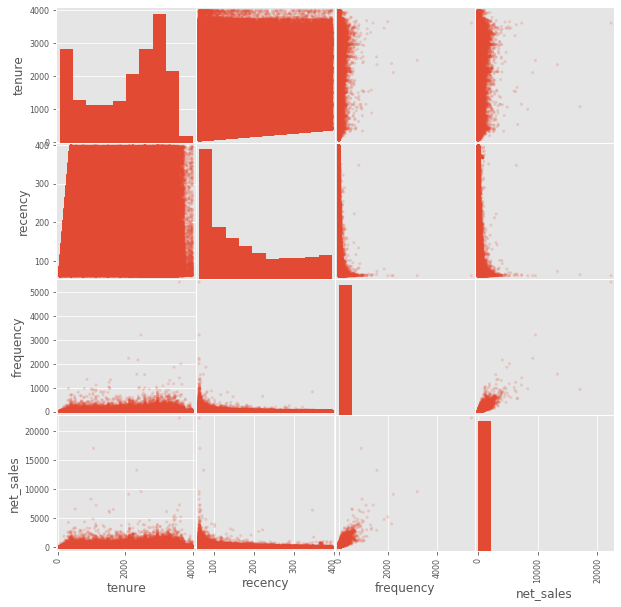

In [6]:
pd.plotting.scatter_matrix(tx_user, alpha=0.2, figsize=(10, 10))
plt.show()

Plot distirbutions of each, RFMT to see if skewed.

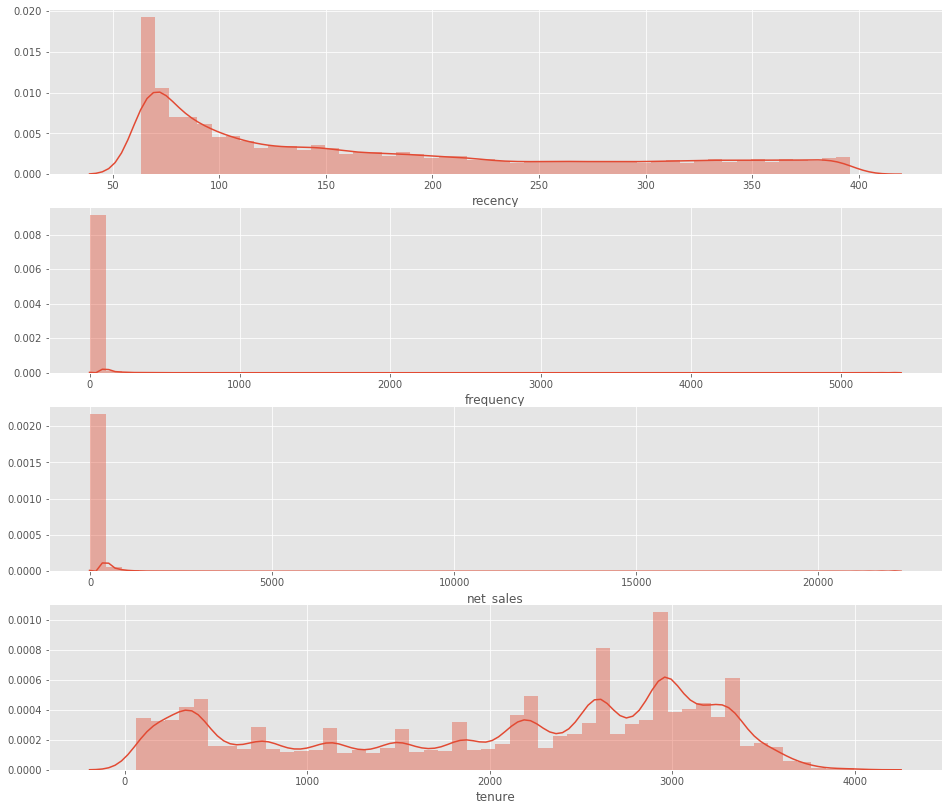

In [11]:
# tx_user['tenure'].hist()
# Plot RFM distributions
plt.figure(figsize=(16,14))
# Plot distribution of R
plt.subplot(4, 1, 1); sns.distplot(tx_user['recency'])
# Plot distribution of F
plt.subplot(4, 1, 2); sns.distplot(tx_user['frequency'])
# Plot distribution of M
plt.subplot(4, 1, 3); sns.distplot(tx_user['net_sales'])
# Plot distribution of T
plt.subplot(4, 1, 4); sns.distplot(tx_user['tenure'])
# Show the plot
plt.show()

Normalize skewed data.

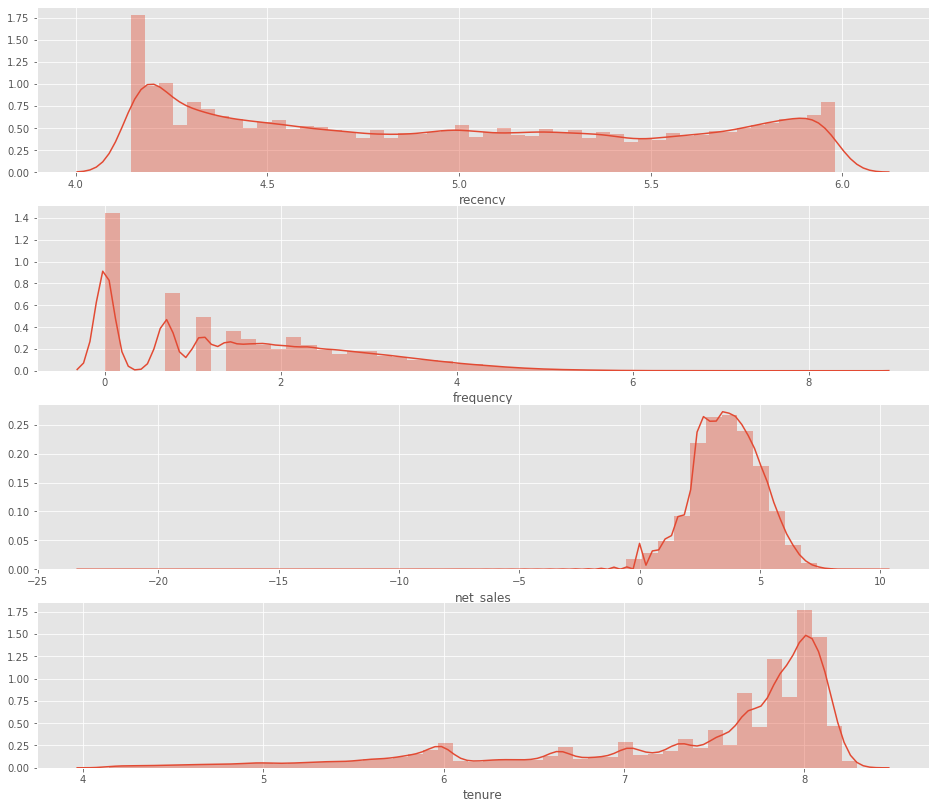

In [4]:
# Apply Log Transformation
# avoid 0s
tx_user['net_sales'] = tx_user['net_sales'] + 0.0000000001
# tx_user['tenure'] = tx_user['tenure'] + 0.0000000001
recency_log = np.log(tx_user['recency'])
frequency_log = np.log(tx_user['frequency'])
monetary_log = np.log(tx_user['net_sales'])
tenure_log = np.log(tx_user['tenure'])

# tenure_log = np.where(tx_user['tenure']>0, np.log(tx_user['tenure']), 0)
    
# Plot RFM distributions
plt.figure(figsize=(16,14))
# Plot distribution of R
plt.subplot(4, 1, 1); sns.distplot(recency_log)
# # Plot distribution of F
plt.subplot(4, 1, 2); sns.distplot(frequency_log)
# # Plot distribution of M
plt.subplot(4, 1, 3); sns.distplot(monetary_log)
# # Plot distribution of M
plt.subplot(4, 1, 4); sns.distplot(tenure_log)
# # Show the plot
# plt.show()

In [5]:
# setting our df to our transformed data.
tx_user["recency_log"] = np.log(tx_user['recency'])
tx_user["frequency_log"] = np.log(tx_user['frequency'])
tx_user["monetary_log"] = np.log(tx_user['net_sales'])
tx_user["tenure_log"] = np.log(tx_user['tenure'])


In [6]:
tx_user.query("net_sales > 5000")

,userid,country,RegistrationDate,tenure,recency,frequency,net_sales,recency_log,frequency_log,monetary_log,tenure_log
15747,14C7A5C7-D52D-47B1-A2E5-0F9F19EE7869,CA,2014-04-27 15:30:22,2106,63,2224,9147.3820,4.143135,7.707063,9.121223,7.652546
25377,CC7AEB73-7CA8-40D5-9274-0CBE474473FA,CA,2011-04-01 02:12:23,3228,64,890,6170.5185,4.158883,6.791221,8.727538,8.079618
31261,B9637100-0DC2-4118-9EF3-137F1D5923E0,CA,2010-02-03 06:36:21,3650,63,1996,5253.6220,4.143135,7.598900,8.566673,8.202482
33381,0F48D33F-8C8D-4693-8807-1EE986F92924,CA,2016-12-16 01:56:15,1142,64,1110,7264.2900,4.158883,7.012115,8.890726,7.040536
39778,C4994E7B-8928-40CB-9231-168423CF96E7,CA,2017-03-02 23:51:26,1066,65,921,17054.0100,4.174387,6.825460,9.744141,6.971669
49435,B2915E5C-ACAE-46CA-970D-16EFAEB9F732,CA,2010-05-04 01:13:21,3560,347,824,6403.6840,5.849325,6.714171,8.764629,8.177516
50227,9049DE2E-F116-4589-9C2E-17FD4B7601B1,CA,2015-11-25 10:18:37,1529,67,1216,6288.0300,4.204693,7.103322,8.746403,7.332369
62541,FF6D1EEF-48D2-4B1A-A71A-2887222CA6FC,CA,2010-03-13 02:37:18,3612,63,5398,22265.0800,4.143135,8.593784,10.010775,8.192017
82724,70CA7EDA-8639-4D58-A750-2DED3EE27054,CA,2013-04-23 01:38:01,2475,63,3194,9602.7759,4.143135,8.069029,9.169807,7.813996
97325,3208AB7B-0E60-4616-8306-41AD83BA197D,CA,2015-11-12 03:50:10,1542,64,1003,6026.5100,4.158883,6.910751,8.703923,7.340836


Handling for outliers. SKIP

In [63]:
tx_recency = tx_user[['recency','frequency', 'net_sales']]

print(tx_recency.quantile(0.95, numeric_only=False))
rev_95 = tx_recency.recency.quantile(0.95)
freq_95 = tx_recency.frequency.quantile(0.95)
nesales_95 = tx_recency.net_sales.quantile(0.95)
print('95 percentile values set.')

# now set outleirs to 95th percentiles
def adjust_outliers_recency(x):

    if x.recency > rev_95:
        return rev_95
    else:
        return x.recency

def adjust_outliers_freq(x):

    if x.frequency > freq_95:
        return freq_95
    else:
        return x.frequency

def adjust_outliers_netsales(x):

    if x.net_sales > nesales_95:
        return nesales_95
    else:
        return x.net_sales

print('updating outliers to 95th percentile.')
tx_user['recency'] = tx_user.apply(adjust_outliers_recency, axis=1)
tx_user['frequency'] = tx_user.apply(adjust_outliers_freq, axis=1)
tx_user['net_sales'] = tx_user.apply(adjust_outliers_netsales, axis=1)
print('Print max of values.')
print(tx_user.recency.max(), tx_user.frequency.max(), tx_user.net_sales.max())


recency      1962.000000
frequency      54.000000
net_sales     437.577855
Name: 0.95, dtype: float64
95 percentile values set.
updating outliers to 95th percentile.
Print max of values.
1962.0 54.0 437.5778549999998


Feature Scaling

In [7]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline

num_df =  tx_user[["recency_log", "frequency_log", "monetary_log", "tenure_log"]]
num_df.describe()
# num_df = tx_user.drop(columns=["userid", "country", "registrationdate", "maxpurchasedate", "custAgeDays"])

,recency_log,frequency_log,monetary_log,tenure_log
count,432089.000000,432089.000000,432089.000000,432089.000000
mean,4.974585,1.578522,3.604058,7.345421
std,0.587779,1.321571,1.482428,0.918463
min,4.143135,0.000000,-23.025851,4.143135
25%,4.418841,0.693147,2.638343,6.997596
50%,4.934474,1.386294,3.610648,7.758761
75%,5.505332,2.484907,4.594413,7.992945
max,5.981414,8.593784,10.010775,8.293800


In [8]:
num_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())
num_df_cleaned = num_pipeline.fit_transform(num_df)
data_df = pd.DataFrame(num_df_cleaned, columns=num_df.columns, index=num_df.index)                                     
data_df.head()

# visualize standardized data
# pd.plotting.scatter_matrix(data_df, alpha=0.2, figsize=(10, 10))
# plt.show()

,recency_log,frequency_log,monetary_log,tenure_log
0,-1.335420,1.033557,1.178086,0.966056
1,-0.497559,0.903522,1.319983,0.340577
2,-1.140771,0.802482,0.626656,-0.039423
3,-0.807747,-0.145454,0.404767,0.652641
4,-0.697946,0.746406,0.513657,0.698738


Visualize recency, frequency, net sales again to see if we still have outliers in our cleaned daaset.

plot histogram of frequency and net sales to determine distribution.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a229ef4a8>,
      dtype=object)

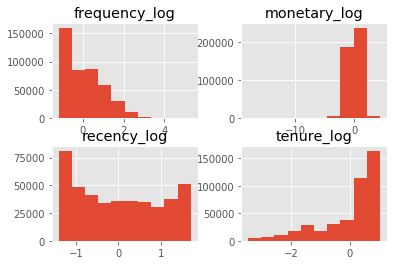

In [23]:
# plot the histogram to determine distribution
print('plot histogram of frequency and net sales to determine distribution.')

data_df.hist()

Merge cleaned up columns back with main df as a copy.

In [9]:
# tx_user = tx_user.rename(columns={"recency": "recency_v1", "frequency": "frequency_v1", "net_sales": "net_sales_v1", "tenure": "tenure_v1"})
tx_user = tx_user.drop(columns=["recency_log", "frequency_log", "monetary_log", "tenure_log"]) # drop old log cols
# replace log cols with standardized logs
data_clean = pd.concat([tx_user, data_df], axis=1) 
data_clean.info(null_counts=True)
data_clean.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 432089 entries, 0 to 432088
Data columns (total 11 columns):
userid              432089 non-null object
country             432089 non-null object
RegistrationDate    432089 non-null datetime64[ns]
tenure              432089 non-null int64
recency             432089 non-null int64
frequency           432089 non-null int64
net_sales           432089 non-null float64
recency_log         432089 non-null float64
frequency_log       432089 non-null float64
monetary_log        432089 non-null float64
tenure_log          432089 non-null float64
dtypes: datetime64[ns](1), float64(5), int64(3), object(2)
memory usage: 39.6+ MB


,userid,country,RegistrationDate,tenure,recency,frequency,net_sales,recency_log,frequency_log,monetary_log,tenure_log
0,EDF4332A-8C6F-4913-9A23-0001292F7792,CA,2009-10-14 18:26:37,3762,66,19,210.71,-1.335420,1.033557,1.178086,0.966056
1,C3620CF1-60D9-4888-8495-00012EC0D0F7,CA,2014-04-15 18:26:09,2118,108,16,260.04,-0.497559,0.903522,1.319983,0.340577
2,6EEF039F-9DF9-49DE-AAA1-00046FBEF18B,CA,2015-12-30 03:57:41,1494,74,14,93.04,-1.140771,0.802482,0.626656,-0.039423
3,8602A782-0519-4184-8ABD-00051D204387,CA,2012-05-12 18:31:33,2821,90,4,66.96,-0.807747,-0.145454,0.404767,0.652641
4,BEB9B4EC-5F88-46FA-8364-000BCF785471,CA,2012-01-11 14:46:08,2943,96,13,78.69,-0.697946,0.746406,0.513657,0.698738


In [10]:
# quick fix for monetary value decimals
data_clean = data_clean.round({"net_sales": 2})
# data_clean.head()

In [11]:
# function for ordering cluster numbers
def order_cluster(cluster_field_name, target_field_name, df, ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name, ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df, df_new[[cluster_field_name, 'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name], axis=1)
    df_final = df_final.rename(columns={"index": cluster_field_name})
    return df_final

1. Recency:
Find optimal clusters for Recency

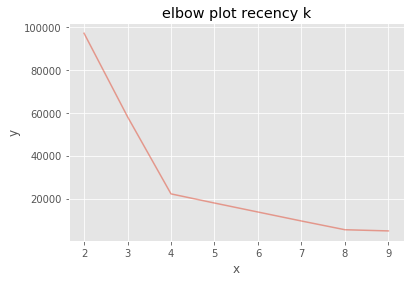

In [24]:
sse_rec = {}
tx_recency = data_clean[['recency_log']].copy()
for k in range(2, 10):
   kmeans = KMeans(n_clusters=k, max_iter=1000).fit(tx_recency)
   tx_recency["clusters"] = kmeans.labels_
   sse_rec[k] = kmeans.inertia_

x=list(sse_rec.keys())
y=list(sse_rec.values())
plt.plot(x, y, alpha=0.5)
plt.title('elbow plot recency k')
plt.xlabel('x')
plt.ylabel('y')
plt.show()
# plot_data = [
#      go.Scatter(
#          x=list(sse_rec.keys()),
#          y=list(sse_rec.values()),
#          mode='lines',
#          name='kMeans Recency Clusters'
#      )
#  ]
# plot_layout = go.Layout(
#          title=' Recency Clusters'
#      )
# fig = go.Figure(data=plot_data, layout=plot_layout)
# plot(fig,
#      auto_open=False,
#      filename='plot_recency_clusters.html')

In [12]:

# build 4-6 clusters for recency and add it to dataframe
print('assigning recency clusters.')
data_clean['RecencyCluster'] = KMeans(n_clusters=4, init='k-means++', max_iter=1000, random_state=0).fit_predict(data_clean[['recency_log']])
data_clean = order_cluster('RecencyCluster', 'recency_log', data_clean, False)
print(data_clean.groupby('RecencyCluster')['recency'].describe())


assigning recency clusters.
                   count        mean        std    min    25%    50%    75%  \
RecencyCluster                                                                
0               108328.0  323.767659  43.878834  246.0  286.0  326.0  362.0   
1                97084.0  190.009301  27.965881  147.0  166.0  188.0  213.0   
2                94771.0  116.230735  16.193267   92.0  102.0  114.0  130.0   
3               131906.0   73.623869   8.470330   63.0   66.0   72.0   81.0   

                  max  
RecencyCluster         
0               396.0  
1               245.0  
2               146.0  
3                91.0  


2. Frequency: 
Finding optimal clusters for Frequency

plot histogram of frequency and net sales to determine distribution.


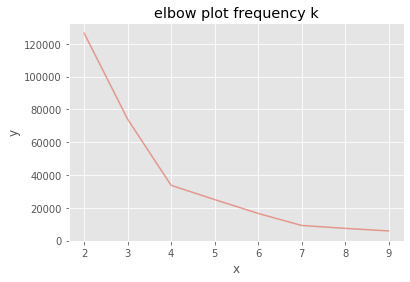

In [25]:

# print('Getting frequency clusters...4-5 ideal.')
# # get the total orders for each customer and create a dataframe with it
# # tx_freq = tx_data.groupby('userid').units.sum().reset_index()
# # tx_freq.columns = ['userid', 'Frequency']
# # # print(tx_freq.head())
# # tx_user = pd.merge(tx_user, tx_freq, on='userid')

# tx_freqquency = tx_user[['frequency']]
# # freqquency_score_list = []
# # for i in range(5, 10):
# #     km = KMeans(n_clusters=i).fit(tx_freqquency)
# #     # y_pred = km.predict(tx_recency)
# #     y_pred = km.labels_
# #     # Evaluate model
# #     score = silhouette_score(tx_freqquency, y_pred)
# #     freqquency_score_list.append(score)
# #     print("Silhouette score: {}, {}".format(i, score))
# # print(freqquency_score_list)

sse_freq={}
tx_freq = data_clean[['frequency_log']].copy()
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(tx_freq)
    tx_freq["clusters"] = kmeans.labels_
    sse_freq[k] = kmeans.inertia_

# plot the histogram to determine distribution
print('plot histogram of frequency and net sales to determine distribution.')
x=list(sse_freq.keys())
y=list(sse_freq.values())
plt.plot(x, y, alpha=0.5)
plt.title('elbow plot frequency k')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

In [13]:
print('assigning frequency clusters.')
# build 4-6 clusters for frequency and add it to dataframe
data_clean['FrequencyCluster'] = KMeans(n_clusters=4, init='k-means++', max_iter=1000, random_state=0).fit_predict(data_clean[['frequency_log']])

data_clean = order_cluster('FrequencyCluster', 'frequency_log', data_clean, True)
print(data_clean.groupby('FrequencyCluster')['frequency'].describe())


assigning frequency clusters.
                     count       mean        std   min   25%   50%   75%  \
FrequencyCluster                                                           
0                 159944.0   1.329522   0.470041   1.0   1.0   1.0   2.0   
1                 129519.0   4.871054   1.656423   3.0   3.0   5.0   6.0   
2                  96545.0  15.927060   5.733115   9.0  11.0  15.0  20.0   
3                  46081.0  70.824396  75.437998  30.0  37.0  50.0  77.0   

                     max  
FrequencyCluster          
0                    2.0  
1                    8.0  
2                   29.0  
3                 5398.0  


3. Finding optimal clusters for Monetary (Lifetime Net Sales)

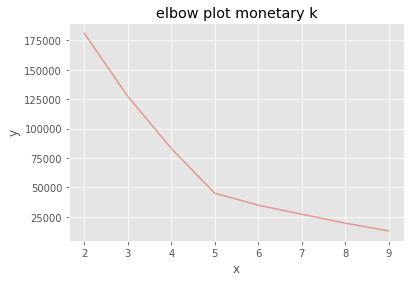

In [26]:
# check elbow method for cluster size
sse_rev={}
tx_rev = data_clean[['monetary_log']].copy()
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(tx_rev)
    tx_rev["clusters"] = kmeans.labels_
    sse_rev[k] = kmeans.inertia_
    
x=list(sse_rev.keys())
y=list(sse_rev.values())
plt.plot(x, y, alpha=0.5)
plt.title('elbow plot monetary k')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

In [14]:
print('assigning net sales clusters.')
# build 5 clusters for sales and add it to dataframe
data_clean['Net_SalesCluster'] = KMeans(n_clusters=5, init='k-means++', max_iter=1000, random_state=0).fit_predict(data_clean[['monetary_log']])

data_clean = order_cluster('Net_SalesCluster', 'monetary_log', data_clean, True)
print(data_clean.groupby('Net_SalesCluster')['net_sales'].describe())


assigning net sales clusters.
                     count        mean         std     min     25%     50%  \
Net_SalesCluster                                                             
0                    143.0    0.000000    0.000000    0.00    0.00    0.00   
1                  43676.0    3.509359    1.740950    0.01    1.99    3.69   
2                 145092.0   16.498549    6.284277    6.71   10.99   15.28   
3                 152308.0   62.227717   24.721797   29.65   40.96   56.93   
4                  90870.0  304.453324  296.741928  118.89  155.76  215.58   

                       75%       max  
Net_SalesCluster                      
0                   0.0000      0.00  
1                   4.9900      6.70  
2                  21.3900     29.64  
3                  80.4100    118.88  
4                 342.8475  22265.08  


In [15]:
# check into ksp redemption-only users because they look like freegans
data_ksp_redemps = data_clean.loc[data_clean["net_sales"] == 0]
data_ksp_redemps.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 143 entries, 431946 to 432088
Data columns (total 14 columns):
userid              143 non-null object
country             143 non-null object
RegistrationDate    143 non-null datetime64[ns]
tenure              143 non-null int64
recency             143 non-null int64
frequency           143 non-null int64
net_sales           143 non-null float64
recency_log         143 non-null float64
frequency_log       143 non-null float64
monetary_log        143 non-null float64
tenure_log          143 non-null float64
RecencyCluster      143 non-null int64
FrequencyCluster    143 non-null int64
Net_SalesCluster    143 non-null int64
dtypes: datetime64[ns](1), float64(5), int64(6), object(2)
memory usage: 16.8+ KB


In [31]:
# check how many users are in each net sales grouping, just as a verification
print(data_clean.groupby('Net_SalesCluster')['net_sales'].count())

Net_SalesCluster
0       143
1     43676
2    145092
3    152308
4     90870
Name: net_sales, dtype: int64


VERSION 1: Create label combinations of clusters from R, F, M and assign to each user.

In [16]:
print('Assigning labels to segments.')

# calculate mix scores for various customer groups
data_clean['Segment'] = 'Needs Attention'

# data_clean.loc[(data_clean['FrequencyCluster']==3), 'Segment'] = 'Loyalists'

data_clean.loc[(data_clean['Net_SalesCluster']==4), 'Segment'] = 'Whales'

data_clean.loc[(data_clean['RecencyCluster']== 0) & (data_clean['FrequencyCluster'] == 3), 'Segment'] = 'Churned Loyalists'

data_clean.loc[(data_clean['RecencyCluster']== 3) & (data_clean['FrequencyCluster'] == 0), 'Segment'] = 'Rookies'

data_clean.loc[(data_clean['RecencyCluster'] == 3) & (data_clean['FrequencyCluster'] == 3) & (
       data_clean['Net_SalesCluster'] == 4), 'Segment'] = 'Champions'

data_clean.loc[(data_clean['RecencyCluster'] == 3) & (data_clean['FrequencyCluster']==2) & (
       data_clean['Net_SalesCluster'] == 4), 'Segment'] = 'Potential Champions'

data_clean.loc[(data_clean['RecencyCluster'] == 3) & (data_clean['FrequencyCluster'].isin([0,1])) & (
       data_clean['Net_SalesCluster'].isin([3,4])), 'Segment'] = 'New and Promising'

data_clean.loc[(data_clean['RecencyCluster'] == 3) & (data_clean['FrequencyCluster'].isin([2,3])) & (
       data_clean['Net_SalesCluster'].isin([0,1])), 'Segment'] = 'Frequent Low-Spend'

data_clean.loc[(data_clean['RecencyCluster']== 0) & (data_clean['FrequencyCluster'] == 3) & (
       data_clean['Net_SalesCluster'] == 4), 'Segment'] = 'Churned Champions'

data_clean.loc[(data_clean['RecencyCluster'] == 0) & (data_clean['FrequencyCluster'] == 0) & (
       data_clean['Net_SalesCluster']== 0 ), 'Segment'] =  'Require Activation'

# we want to see averages of the actual values, not the standardized cols
data_clean.groupby('Segment')['recency', 'frequency', 'net_sales'].median().reset_index().style.hide_index()

Assigning labels to segments.


Segment,recency,frequency,net_sales
Champions,67,55,360.73
Churned Champions,277,41,243.21
Churned Loyalists,280,34,84.9
Frequent Low-Spend,86,10,5.03
Needs Attention,188,3,23.98
New and Promising,76,5,55.96
Potential Champions,73,19,178.86
Require Activation,333,1,0
Rookies,76,1,11.99
Whales,121,18,173.86


In [17]:
user_counts = data_clean.groupby('Segment')['userid'].count().reset_index()
user_counts.sort_values(by=['userid'], ascending=False).style.hide_index()

Segment,userid
Needs Attention,304624
Champions,35316
Whales,27721
Potential Champions,26831
New and Promising,23163
Rookies,14079
Churned Champions,263
Churned Loyalists,54
Require Activation,37
Frequent Low-Spend,1


In [20]:
# find averages across all data set
data_clean.median().reset_index()

,index,0
0,tenure,2342.000000
1,recency,139.000000
2,frequency,4.000000
3,net_sales,36.990000
4,recency_log,-0.068243
5,frequency_log,-0.145454
6,monetary_log,0.004445
7,tenure_log,0.450035
8,RecencyCluster,2.000000
9,FrequencyCluster,1.000000


VERSION 2: RFM score value.
We may want to aggregate the scores for a ranking system. But one avg score makes it harder to identify what factor contributed.

In [22]:


# calculate overall avg RFM score and use mean() to see details
data_clean['OverallScore'] = data_clean['RecencyCluster'] + data_clean['FrequencyCluster'] + data_clean['Net_SalesCluster']
# print(data_clean.groupby('OverallScore')['recency', 'frequency', 'net_sales'].mean())

# Define rfm_level function
def rfm_level(data_clean):
    if data_clean['OverallScore']  >= 8:
        return 'Can\'t Loose Them'
    elif ((data_clean['OverallScore'] >= 7) and (data_clean['OverallScore'] < 8)):
        return 'Champions'
    elif ((data_clean['OverallScore'] >= 5) and (data_clean['OverallScore'] < 7)):
        return 'Loyal'
    elif ((data_clean['OverallScore'] >= 4) and (data_clean['OverallScore'] < 5)):
        return 'Potential'
    elif ((data_clean['OverallScore'] >= 3) and (data_clean['OverallScore'] < 4)):
        return 'Promising'
    elif ((data_clean['OverallScore'] >= 2) and (data_clean['OverallScore'] < 3)):
        return 'Needs Attention'
    else:
        return 'Require Activation'
# Create a new variable RFM_Level
data_clean['RFM_Level'] = data_clean.apply(rfm_level, axis=1)
# Print the header with top 5 rows to the console
data_clean.head()

rfm_level_agg = data_clean.groupby('RFM_Level').agg({
    'recency': 'mean',
    'frequency': 'mean',
    'net_sales': ['mean', 'count']
}).round(1)
# Print the aggregated dataset
print(rfm_level_agg)

                   recency frequency net_sales        
                      mean      mean      mean   count
RFM_Level                                             
Can't Loose Them      80.8      40.0     262.5  107468
Champions            103.5      10.2      81.9   42310
Loyal                144.3       5.7      49.8   96241
Needs Attention      304.8       1.3      12.7   60373
Potential            195.1       3.0      27.9   53665
Promising            225.2       2.0      17.4   51169
Require Activation   331.1       1.1       3.4   20863


Save pickle as checkpoint. Also output a csv file of DF.

In [24]:
# first save the groupby output
agg_dataset = data_clean.groupby('Segment')['recency', 'frequency', 'net_sales'].median().reset_index()
agg_dataset.to_csv('/Users/htahir/Documents/Python/kobo_customer_analysis/summary_user_segments.csv', index=False)

In [18]:
# then save checkpoint
data_clean.to_pickle('/Users/htahir/Documents/Python/kobo_customer_analysis/user_df_with_segmentlabels.pkl')
data_clean.to_csv('/Users/htahir/Documents/Python/kobo_customer_analysis/user_df_with_segmentlabels.csv',index=False)

print('logged user data pickle. Also created csv.')

# tx_newhighpaying = data_clean.loc[data_clean['Segment'] == 'New High-Paying']
# print(tx_newhighpaying.head(10)) # debug

logged user data pickle. Also created csv.


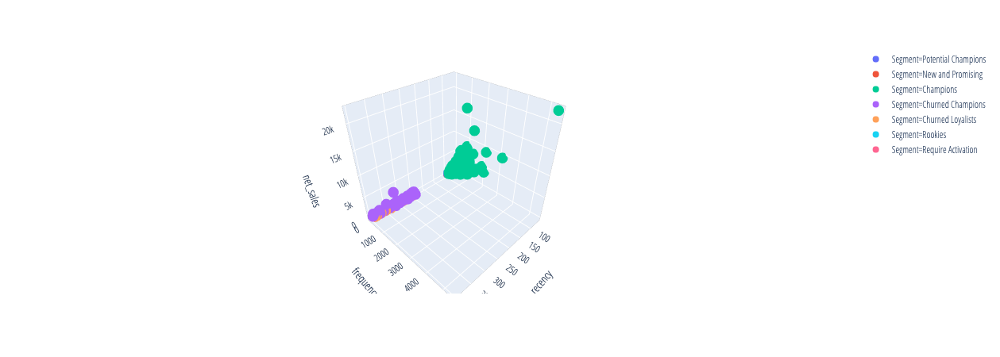

'/Users/htahir/Documents/Python/kobo_customer_analysis/plot_3d_customer_clusters.html'

In [34]:
import plotly.express as px
# df = px.data.iris()
# c = {'Champions': 'red', 'Potential Champions': 'blue', 'New and Promising': 'green', 'Rookies' : 'white', 'Churned Champions' :'black'}
viz_data = data_clean.loc[data_clean.Segment.isin(["Champions", 
                                                   "Potential Champions", 
                                                   "New and Promising", 
                                                   "Rookies", "Churned Champions",
                                                   "Churned Loyalists","Require Activation"]),]
fig = px.scatter_3d(viz_data, x='recency', y='frequency', z='net_sales',
              color='Segment')
fig.show()
fig.update_traces(marker=dict(size=6,
                              opacity=0.5
#                               line=dict(width=40,
#                                         color='DarkSlateGrey')
                             ),
                  selector=dict(mode='markers'))
plot(fig,
     auto_open=False,
     filename='/Users/htahir/Documents/Python/kobo_customer_analysis/plot_3d_customer_clusters.html')

# viz_data.iplot(kind='scatter3d',x='recency',y='frequency',z='net_sales',size=15,
#                              title='Cufflinks - Scatter 3D Chart',colors=['blue','red'],width=0.5,margin=(0,0,0,0),
#                              opacity=1)
# viz_data.head(3)

Appendix Code Below this point.

Text(0, 0.5, 'Frequency')

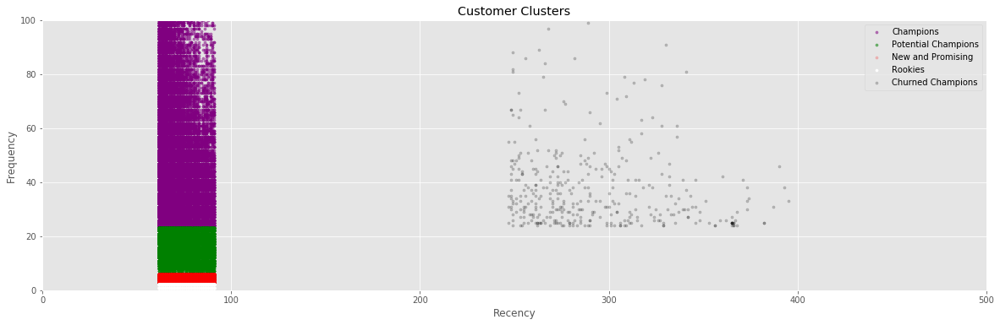

In [370]:
# x = data_clean.loc[(data_clean['Segment'] == "Champions"),'recency']
# x

plt.figure(figsize=(20,20))
plt.subplot(3, 1, 1);
plt.scatter(data_clean[data_clean['Segment'] == "Champions"].loc[:,'recency'], data_clean[data_clean['Segment'] == "Champions"].loc[:,'frequency'], s= 10, c='purple', label = 'Champions', alpha=0.5)
plt.scatter(data_clean[data_clean['Segment'] == "Potential Champions"].loc[:,'recency'], data_clean[data_clean['Segment'] == "Potential Champions"].loc[:,'frequency'], s= 10, c='green', label = 'Potential Champions', alpha=0.5)
plt.scatter(data_clean[data_clean['Segment'] == "New and Promising"].loc[:,'recency'], data_clean[data_clean['Segment'] == "New and Promising"].loc[:,'frequency'], s= 10, c='red', label = 'New and Promising', alpha=0.2)
plt.scatter(data_clean[data_clean['Segment'] == "Rookies"].loc[:,'recency'], data_clean[data_clean['Segment'] == "Rookies"].loc[:,'frequency'], s= 10, c='white', label = 'Rookies', alpha=1)
plt.scatter(data_clean[data_clean['Segment'] == "Churned Champions"].loc[:,'recency'], data_clean[data_clean['Segment'] == "Churned Champions"].loc[:,'frequency'], s= 10, c='black', label = 'Churned Champions', alpha=0.2)

# plt.xticks(np.arange(0, 1000, 100)) 
# plt.yticks(np.arange(0, 10000, 1000))
# axes = plt.gca()

plt.legend()
plt.xlim(0, 500)
plt.ylim(0, 100)
plt.title('Customer Clusters')
plt.xlabel('Recency')
plt.ylabel('Frequency')

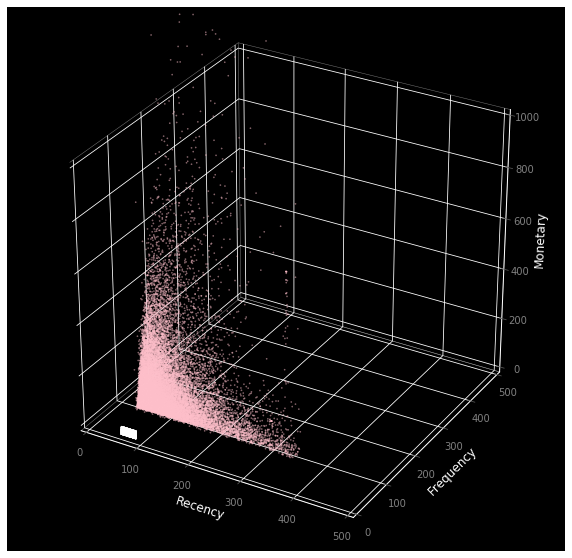

In [61]:
from mpl_toolkits import mplot3d
xchamp = data_clean[data_clean['Segment'] == "Potential Champions"].loc[:,'recency']
ychamp = data_clean[data_clean['Segment'] == "Potential Champions"].loc[:,'frequency']
zchamp = data_clean[data_clean['Segment'] == "Potential Champions"].loc[:,'net_sales']

xnewp = data_clean[data_clean['Segment'] == "New and Promising"].loc[:,'recency']
ynewp = data_clean[data_clean['Segment'] == "New and Promising"].loc[:,'frequency']
znewp= data_clean[data_clean['Segment'] == "New and Promising"].loc[:,'net_sales']

xChampions = data_clean[data_clean['Segment'] == "Champions"].loc[:,'recency']
yChampions = data_clean[data_clean['Segment'] == "Champions"].loc[:,'frequency']
zChampions = data_clean[data_clean['Segment'] == "Champions"].loc[:,'net_sales']

xrookies = data_clean[data_clean['Segment'] == "Rookies"].loc[:,'recency']
yrookies = data_clean[data_clean['Segment'] == "Rookies"].loc[:,'frequency']
zrookies = data_clean[data_clean['Segment'] == "Rookies"].loc[:,'net_sales']

xchurnchamps = data_clean[data_clean['Segment'] == "Churned Champions"].loc[:,'recency']
ychurnchamps = data_clean[data_clean['Segment'] == "Churned Champions"].loc[:,'frequency']
zchurnchamps = data_clean[data_clean['Segment'] == "Churned Champions"].loc[:,'net_sales']

# now Whales
xloyalist = data_clean[data_clean['Segment'] == "Whales"].loc[:,'recency']
yloyalist = data_clean[data_clean['Segment'] == "Whales"].loc[:,'frequency']
zloyalist = data_clean[data_clean['Segment'] == "Whales"].loc[:,'net_sales']

plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.set_xlim(0, 500)
ax.set_ylim(0, 500)
ax.set_zlim(0, 1000)
# axes = plt.gca()
# ax.set_facecolor('xkcd:salmon')
ax.set_facecolor('#000000')
ax.w_xaxis.pane.fill = False
ax.w_yaxis.pane.fill = False
ax.w_zaxis.pane.fill = False

# ax.scatter(xchamp, ychamp, zchamp, c='green', s=2, linewidth=0.2, alpha=0.5)
# ax.scatter(xnewp, ynewp, znewp, c='red',s=2, linewidth=0.2, alpha=0.5);
# ax.scatter(xChampions, yChampions, zChampions, c='violet',s=10, linewidth=0.2, alpha=0.5);
# ax.scatter(xrookies, yrookies, zrookies, c='white',s=2, linewidth=0.2, alpha=0.5);
# ax.scatter(xchurnchamps, ychurnchamps, zchurnchamps, c='lightblue',s=2, linewidth=0.2, alpha=0.5);
# ax.scatter(xloyalist, yloyalist, zloyalist, c='pink',s=2, linewidth=0.2, alpha=0.5);

ax.tick_params(labelcolor='gray')
ax.set_xlabel('Recency', color='white')
ax.set_ylabel('Frequency', color='white')
ax.set_zlabel('Monetary',color='white')
plt.show()

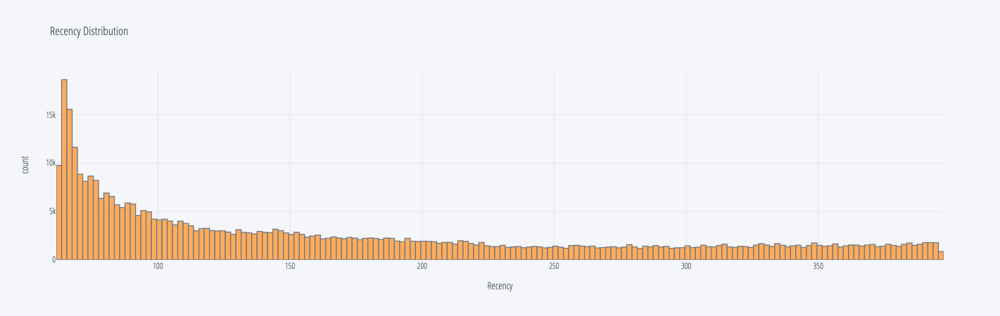

In [36]:
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
import cufflinks as cf

# Set global theme
cf.set_config_file(world_readable=True, theme='pearl')

from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected=True)
cf.go_offline(connected=True)

# cf.datagen.lines().iplot(kind='scatter',xTitle='Bins',yTitle='Returns',title='Recency - Line Chart')
data_clean['recency'].iplot(kind='hist', xTitle='Recency',
                  yTitle='count', title='Recency Distribution')


# # tx_graph = tx_user.query("frequency < 200000")
# tx_graph = tx_user

# plot_data = [
# go.Scatter(
#    x=tx_graph.query("Segment == 'Best'")['frequency'],
#    y=tx_graph.query("Segment == 'Best'")['recency'],
#    mode='markers',
#    name='Best',
#    marker=dict(size=7,
#                 line=dict(width=0.5),
#                 color='blue',
#                 opacity=1
#                 )
# ),
# go.Scatter(
#    x=tx_graph.query("Segment == 'New High-Paying'")['frequency'],
#    y=tx_graph.query("Segment == 'New High-Paying'")['recency'],
#    mode='markers',
#    name='New High-Paying',
#    marker=dict(size=9,
#                line=dict(width=0.5),
#                color='white',
#                opacity=0.85
#                )
# ),
# go.Scatter(
#     x=tx_graph.query("Segment == 'Frequent Low-Spend'")['frequency'],
#     y=tx_graph.query("Segment == 'Frequent Low-Spend'")['recency'],
#     mode='markers',
#     name='Frequent Low-Spend',
#     marker=dict(size=9,
#                 line=dict(width=0.5),
#                 color='pink',
#                 opacity=1
#                 )
# ),
#     go.Scatter(
#     x=tx_graph.query("Segment == 'Churned Best'")['frequency'],
#     y=tx_graph.query("Segment == 'Churned Best'")['recency'],
#     mode='markers',
#     name='Churned Best',
#     marker=dict(size=9,
#                 line=dict(width=0.5),
#                 color='black',
#                 opacity=1
#                 )
# )
# ]
# plot_layout = go.Layout(
#        title='Frequency vs Recency Segments',
#        yaxis={'title': "Recency"},
#        xaxis={'title': "Frequency"}
#        )
# fig = go.Figure(data=plot_data, layout=plot_layout)
# plot(fig,
#      auto_open=False,
#      filename='clusters_plot_recency_vs_freq.html')



In [318]:
# # tx_graph = tx_user.query("frequency < 200000")
# tx_graph = data_clean.copy()

# plot_data = [
# go.Scatter(
#    x=tx_graph.query("Segment == 'Champions'")['frequency'],
#    y=tx_graph.query("Segment == 'Champions'")['recency'],
#    mode='markers',
#    name='Champtions',
#    marker=dict(size=7,
#                 line=dict(width=0.5),
#                 color='blue',
#                 opacity=0.5
#                 )
# ),
# go.Scatter(
#    x=tx_graph.query("Segment == 'Potential Champions'")['frequency'],
#    y=tx_graph.query("Segment == 'Potential Champions'")['recency'],
#    mode='markers',
#    name='Potential Champions',
#    marker=dict(size=9,
#                line=dict(width=0.5),
#                color='white',
#                opacity=0.5
#                )
# ),
# go.Scatter(
#     x=tx_graph.query("Segment == 'New and Promising'")['frequency'],
#     y=tx_graph.query("Segment == 'New and Promising'")['recency'],
#     mode='markers',
#     name='New and Promising',
#     marker=dict(size=9,
#                 line=dict(width=0.5),
#                 color='pink',
#                 opacity=0.5
#                 )
# ),
#     go.Scatter(
#     x=tx_graph.query("Segment == 'Rookies'")['frequency'],
#     y=tx_graph.query("Segment == 'Rookies'")['recency'],
#     mode='markers',
#     name='Rookies',
#     marker=dict(size=9,
#                 line=dict(width=0.5),
#                 color='green',
#                 opacity=0.5
#                 )
# )
# #     go.Scatter(
# #     x=tx_graph.query("Segment == 'Churned Champions'")['frequency'],
# #     y=tx_graph.query("Segment == 'Churned Champions'")['recency'],
# #     mode='markers',
# #     name='Churned Champions',
# #     marker=dict(size=9,
# #                 line=dict(width=0.5),
# #                 color='black',
# #                 opacity=1
# #                 )
# # )
# ]
# plot_layout = go.Layout(
#        title='Frequency vs Recency Segments',
#        yaxis={'title': "Recency"},
#        xaxis={'title': "Frequency"}
#        )
# fig_rec_freg = go.Figure(data=plot_data, layout=plot_layout)
# # plot(fig,
# #      auto_open=False,
# #      filename='clusters_plot_recency_vs_freq.html')
# plot(fig_rec_freg)


'temp-plot.html'